In [1]:
from plotnine import * 
import anndata as ad
import matplotlib as mpl
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

sc.set_figure_params(figsize=(5,4), vector_friendly=False)
from pandas.api.types import CategoricalDtype


In [2]:
samp1 = sc.read_h5ad("lcmv_SNH1.h5ad")
samp3 = sc.read_h5ad("lcmv_SNH3.h5ad")
samp4 = sc.read_h5ad("lcmv_SNH4.h5ad")

In [3]:
samp1.obs["sample_lane"] = "SNH1"
samp3.obs["sample_lane"] = "SNH3"
samp4.obs["sample_lane"] = "SNH4"

In [4]:
merged = sc.concat([samp1, samp3, samp4])
merged.layers

/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


Layers with keys: raw_counts, theta_1

In [5]:
merged.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,n_genes,likely sample,biotin_interaction,biotin_donor,biotin sample,sample count,cell_norm_biotin,cell_norm_donor,sample_lane
AAACCTGAGCGAAGGG-1,2463,7152.0,30.0,0.419463,2456,M16_biotin,70.0,24.0,True,3835.0,0.018253,0.006258,SNH1
AAACCTGCAAATCCGT-1,2227,6617.0,104.0,1.571709,2224,M6,2.0,2.0,False,2846.0,0.000703,0.000703,SNH1
AAACCTGCAAGTTGTC-1,2088,7118.0,79.0,1.109862,2084,M14_biotin,84.0,8.0,True,419.0,0.200477,0.019093,SNH1
AAACCTGCAATGGAGC-1,3868,17145.0,294.0,1.714786,3857,M16_biotin,22.0,1.0,True,1020.0,0.021569,0.000980,SNH1
AAACCTGCACCAGTTA-1,1779,4811.0,54.0,1.122428,1775,M16_biotin,40.0,3.0,True,1127.0,0.035492,0.002662,SNH1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCACTTCAT-1,5568,36272.0,542.0,1.494266,5562,Lu2_biotin,342.0,140.0,True,221.0,1.547511,0.633484,SNH4
TTTGTCATCCAAACTG-1,1414,3513.0,39.0,1.110162,1411,S1,10.0,6.0,False,1519.0,0.006583,0.003950,SNH4
TTTGTCATCCACTCCA-1,1487,6212.0,8.0,0.128783,1484,Lu3,17.0,2.0,False,655.0,0.025954,0.003053,SNH4
TTTGTCATCGCGATCG-1,1398,5396.0,5.0,0.092661,1396,Lu1,4.0,4.0,False,2095.0,0.001909,0.001909,SNH4


In [6]:
def get_sample_info(samp):
    s = samp.split("_")[0]
    infection = "WT"
    if s in ["M4", "M9", "M14", "Li4", "Li5", "Lu5", "S4", "S5", "Lu4" ]:
        infection = "Mut"
    time = "96h"
    if s in ["M6", "M9", "M16", "M8"]:
        time = "50h"
    elif s in ["M11", "M13", "M14"]:
        time = "36hr"
    return infection, time
merged.obs["timepoint"] = [ get_sample_info(s)[1] for s in merged.obs["likely sample"]]
merged.obs["infection"] = [ get_sample_info(s)[0] for s in merged.obs["likely sample"]]
samp_labels = lambda s: "MedLN" if s.startswith("M") else "Liver" if s.startswith("Li") else "Lung" if s.startswith(
"Lu") else "Spleen"
merged.obs["sample origin"] = [ samp_labels(s) for s in merged.obs["likely sample"]]

In [7]:
merged.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,n_genes,likely sample,biotin_interaction,biotin_donor,biotin sample,sample count,cell_norm_biotin,cell_norm_donor,sample_lane,timepoint,infection,sample origin
AAACCTGAGCGAAGGG-1,2463,7152.0,30.0,0.419463,2456,M16_biotin,70.0,24.0,True,3835.0,0.018253,0.006258,SNH1,50h,WT,MedLN
AAACCTGCAAATCCGT-1,2227,6617.0,104.0,1.571709,2224,M6,2.0,2.0,False,2846.0,0.000703,0.000703,SNH1,50h,WT,MedLN
AAACCTGCAAGTTGTC-1,2088,7118.0,79.0,1.109862,2084,M14_biotin,84.0,8.0,True,419.0,0.200477,0.019093,SNH1,36hr,Mut,MedLN
AAACCTGCAATGGAGC-1,3868,17145.0,294.0,1.714786,3857,M16_biotin,22.0,1.0,True,1020.0,0.021569,0.000980,SNH1,50h,WT,MedLN
AAACCTGCACCAGTTA-1,1779,4811.0,54.0,1.122428,1775,M16_biotin,40.0,3.0,True,1127.0,0.035492,0.002662,SNH1,50h,WT,MedLN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCACTTCAT-1,5568,36272.0,542.0,1.494266,5562,Lu2_biotin,342.0,140.0,True,221.0,1.547511,0.633484,SNH4,96h,WT,Lung
TTTGTCATCCAAACTG-1,1414,3513.0,39.0,1.110162,1411,S1,10.0,6.0,False,1519.0,0.006583,0.003950,SNH4,96h,WT,Spleen
TTTGTCATCCACTCCA-1,1487,6212.0,8.0,0.128783,1484,Lu3,17.0,2.0,False,655.0,0.025954,0.003053,SNH4,96h,WT,Lung
TTTGTCATCGCGATCG-1,1398,5396.0,5.0,0.092661,1396,Lu1,4.0,4.0,False,2095.0,0.001909,0.001909,SNH4,96h,WT,Lung


## try filtering non-coding genes from GTF file:
```cat /Genomics/pritykinlab/share/uLIPSTIC/data/lcmv/cellranger_mm10_ref/refdata-gex-mm10-2020-A/genes/genes.gtf | grep "protein_coding" | sed 's/.* gene_name "//' | sed 's/";.*//' | uniq > cell_ranger_protein_coding_genes.csv```

In [8]:
coding_genes = pd.read_csv("cell_ranger_protein_coding_genes.csv", header = None)
coding_genes

,0
0,Xkr4
1,Rp1
2,Sox17
3,Mrpl15
4,Lypla1
...,...
21689,AC124606.1
21690,AC133095.2
21691,AC133095.1
21692,AC234645.1


In [9]:
filtered_merged = merged[:, merged.var_names.intersection(coding_genes[0])].copy()

/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [10]:
filtered_merged.shape

(27043, 11558)

In [11]:
wt_tissue = filtered_merged[(filtered_merged.obs["infection"] == "WT") & 
                            (filtered_merged.obs["sample origin"] != "MedLN")]
wt_tissue.shape

(12324, 11558)

In [12]:
sc.tl.pca(wt_tissue, n_comps=100, svd_solver='arpack')

/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


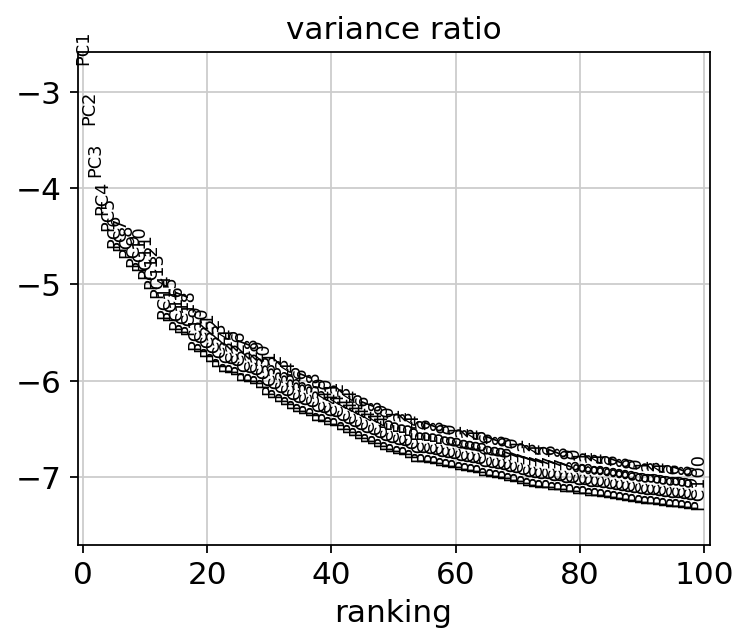

In [13]:
sc.pl.pca_variance_ratio(wt_tissue, 100, log=True, )

In [14]:
n_pcs = 50

## we like cosine similarity more so than Euclidean (better silhouettes once clustering)
sc.pp.neighbors(wt_tissue, n_neighbors=30, n_pcs=n_pcs, use_rep='X_pca', metric="cosine")


2024-01-12 09:27:58.731319: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-12 09:28:09.769076: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-01-12 09:28:09.769109: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-01-12 09:28:51.178929: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2024-

In [15]:
from sklearn.metrics import silhouette_score
silhouette_test = wt_tissue.copy() # don't make actual adata ugly with tons of unnecessary cluster labels

def test_clustering(resolution, ad, num_pcs):
    leiden_key = "leiden_"+str(resolution)
    sc.tl.leiden(ad, resolution=resolution, key_added=leiden_key)
    return silhouette_score(ad.obsm["X_pca"][:, 0:num_pcs], labels = ad.obs[leiden_key], metric="cosine")

silhouette_scores = pd.DataFrame()
## range of 
for res in np.arange(0.2, 3.0, 0.1): 
    sil = test_clustering(res, silhouette_test, n_pcs)  ## same number PCs as used to build KNN graph
    silhouette_scores = pd.concat([silhouette_scores, pd.DataFrame({"resolution": [res], "silhouette": [sil]})])

silhouette_scores.head()

/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


,resolution,silhouette
0,0.2,0.442300
0,0.3,0.373717
0,0.4,0.366174
0,0.5,0.389203
0,0.6,0.369455


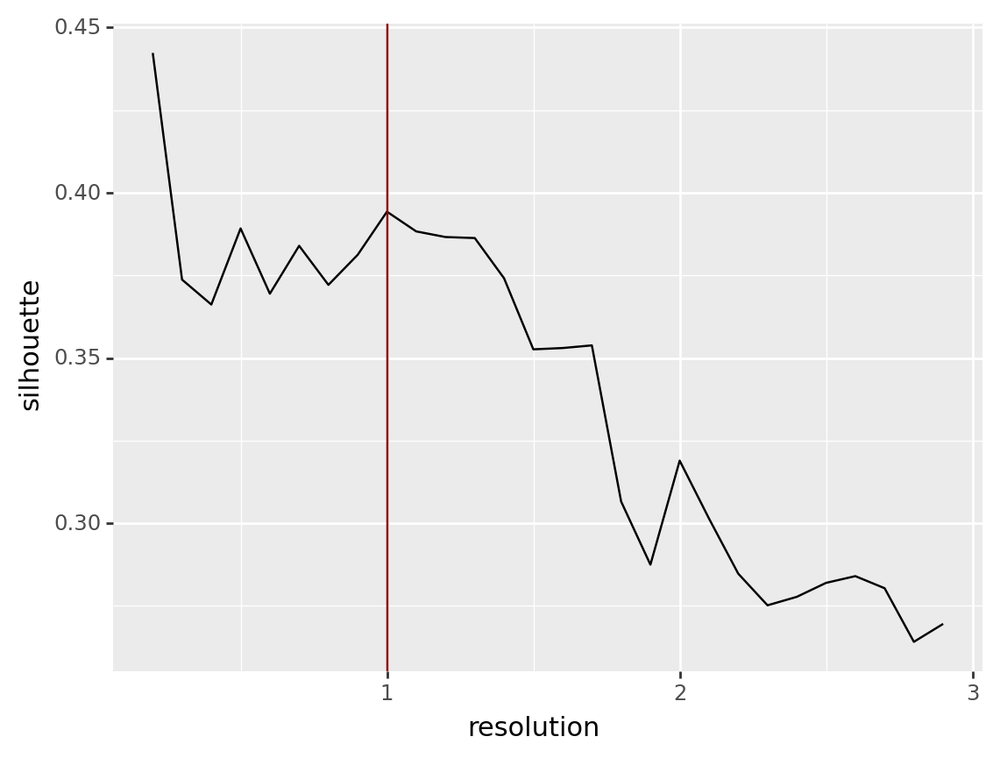

<ggplot: (8794541331372)>

In [16]:
ggplot(silhouette_scores, aes(x="resolution", y="silhouette")) + geom_line() + \
geom_vline(color="darkred", xintercept = 1) + labs(x="resolution")

In [17]:
sc.tl.umap(wt_tissue)

In [18]:
sc.tl.leiden(wt_tissue, resolution = 1)

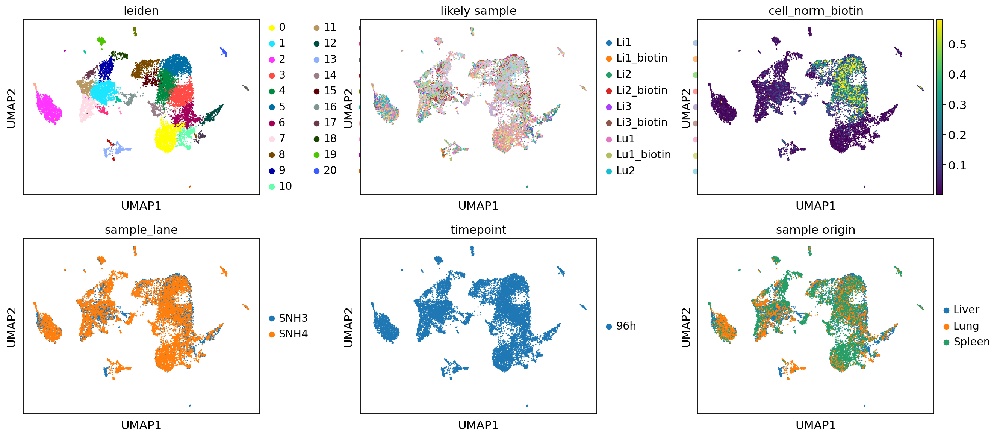

In [19]:
sc.pl.umap(wt_tissue, color= ["leiden", "likely sample", "cell_norm_biotin", "sample_lane", "timepoint", 
                              "sample origin"], ncols = 3, vmin = "p2", vmax = "p98", wspace=0.3)

In [20]:
wt_tissue.obs["tissue"] = wt_tissue.obs["sample origin"]

In [21]:
sc.set_figure_params(dpi_save=200, vector_friendly=False, figsize=(5,5), frameon=False)

## <font color = "blue"> Extended Data Figure 15 Panel A

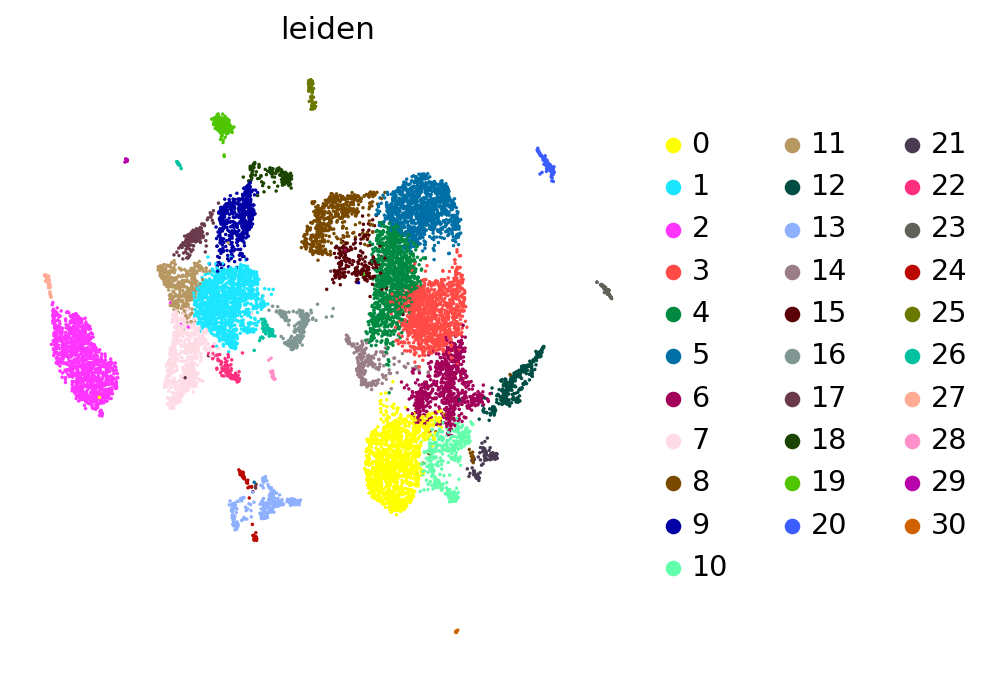

In [22]:
sc.pl.umap(wt_tissue, color = "leiden", save = "_tissue_cl.pdf")

## <font color = "blue"> Extended Data Figure 15 Panel B, left

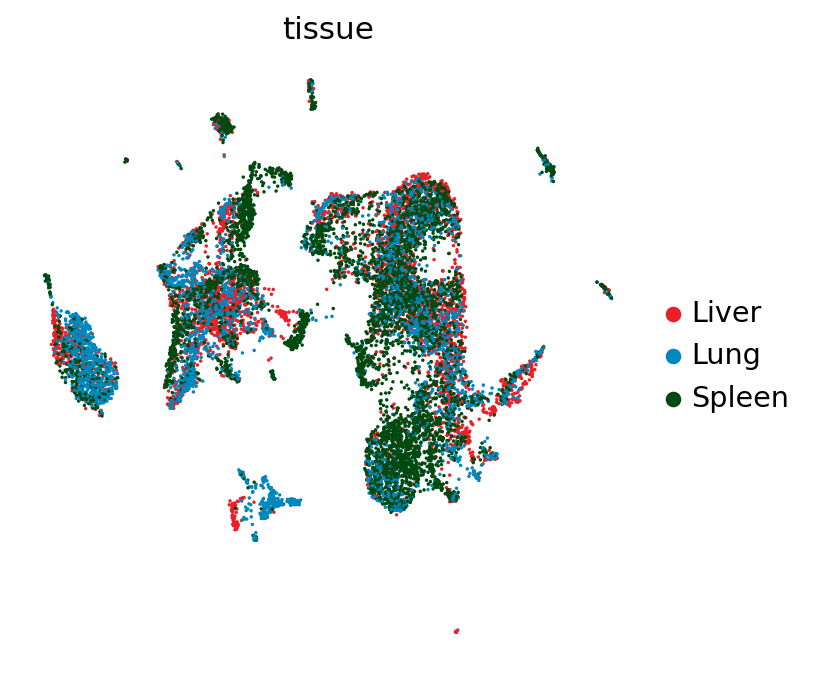

In [23]:
wt_tissue.uns["tissue_colors"] = ["#EA1F27", "#0088BE", "#004910"]
sc.pl.umap(wt_tissue, color = "tissue", save = "_tissue_tissue.pdf")

In [24]:
wt_tissue.obs[" leiden "] = wt_tissue.obs.leiden.astype(pd.api.types.CategoricalDtype(
    wt_tissue.obs.leiden.cat.categories[::-1], ordered = True))

## <font color = "blue"> Extended Data Figure 15 Panel B, right

/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 4 x 6 in image.
/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: tissue_tissue_composition.pdf


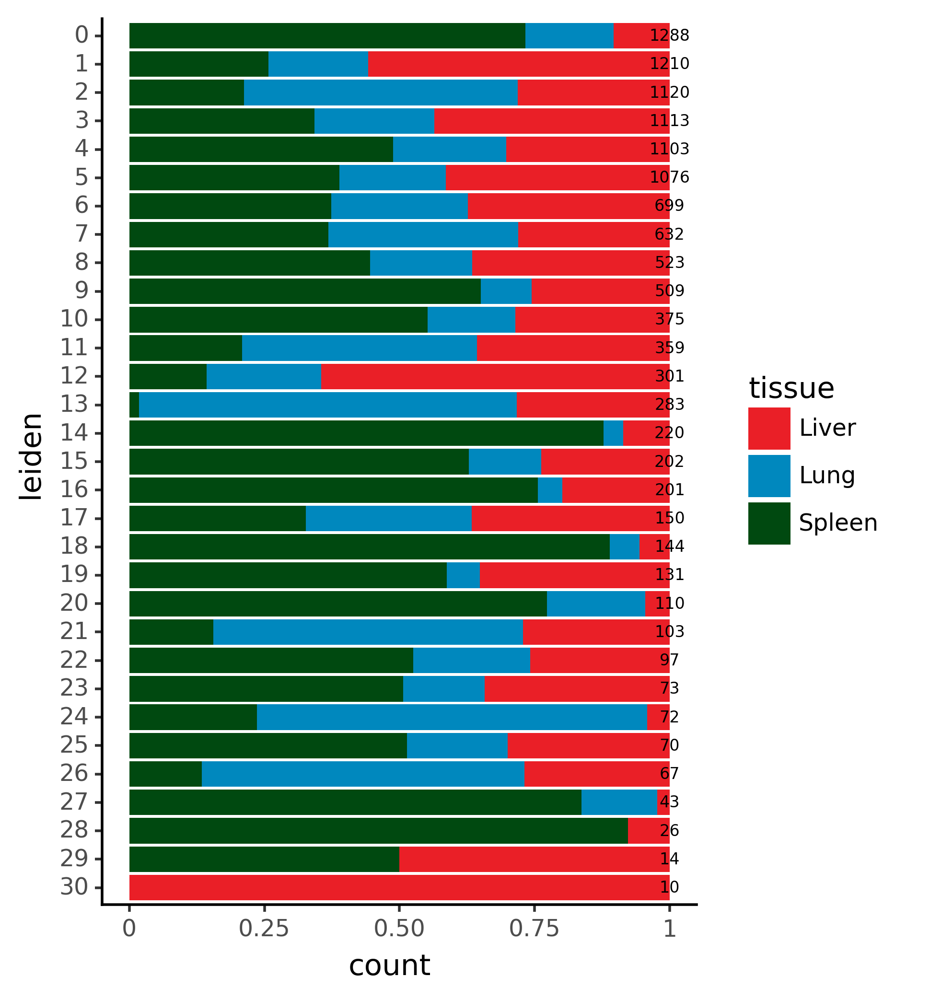

<ggplot: (8794542513131)>

In [25]:
tissue_bar = ggplot(wt_tissue.obs, aes(x=" leiden ", fill = "tissue")) + geom_bar(position = "fill") + \
scale_fill_manual(wt_tissue.uns["tissue_colors"]) + theme_classic() + theme(dpi = 200, figure_size=(4,6)) + \
coord_flip() + geom_text(wt_tissue.obs.groupby([" leiden "]).count().reset_index(), aes(
    x = " leiden ", label = "total_counts"), y = 1, color = "black", size = 6, inherit_aes = False) 
ggsave(tissue_bar, "tissue_tissue_composition.pdf", dpi = 200)
tissue_bar

In [26]:
wt_tissue.obs["mouse"] = wt_tissue.obs["likely sample"].str.split("_").str[0]

In [27]:
wt_tissue.obs["mouse"].unique()

array(['Li3', 'Li2', 'Li1', 'S1', 'S2', 'Lu1', 'Lu3', 'S3', 'Lu2'],
      dtype=object)

## <font color = "blue"> Extended Data Figure 15 Panel C, left

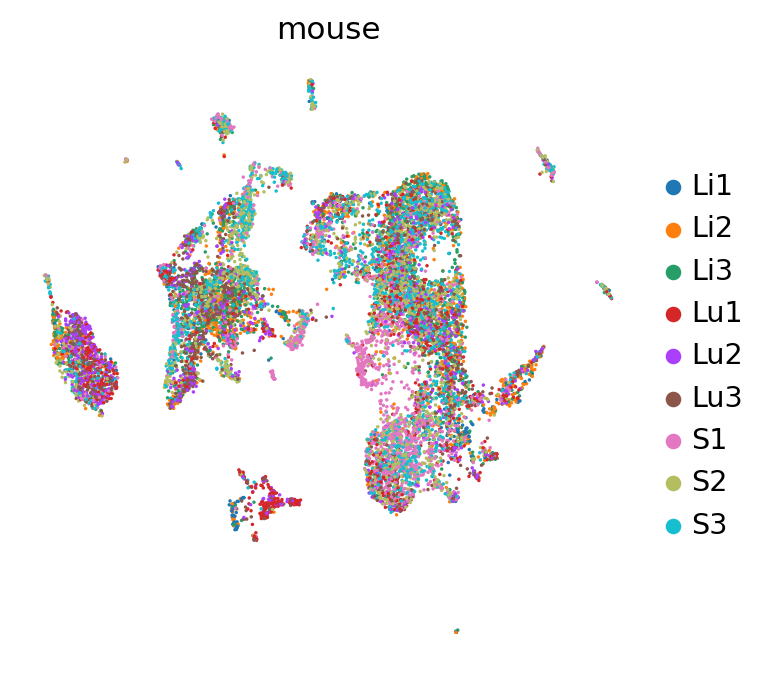

In [28]:
sc.pl.umap(wt_tissue, color = "mouse", save = "_tissue_mouse.pdf")

In [29]:
wt_tissue.obs["biotin_sample"] = wt_tissue.obs["biotin sample"]

## <font color = "blue"> Extended Data Figure 15 Panel C, right

/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 9 x 6 in image.
/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: tissue_sample_composition.pdf


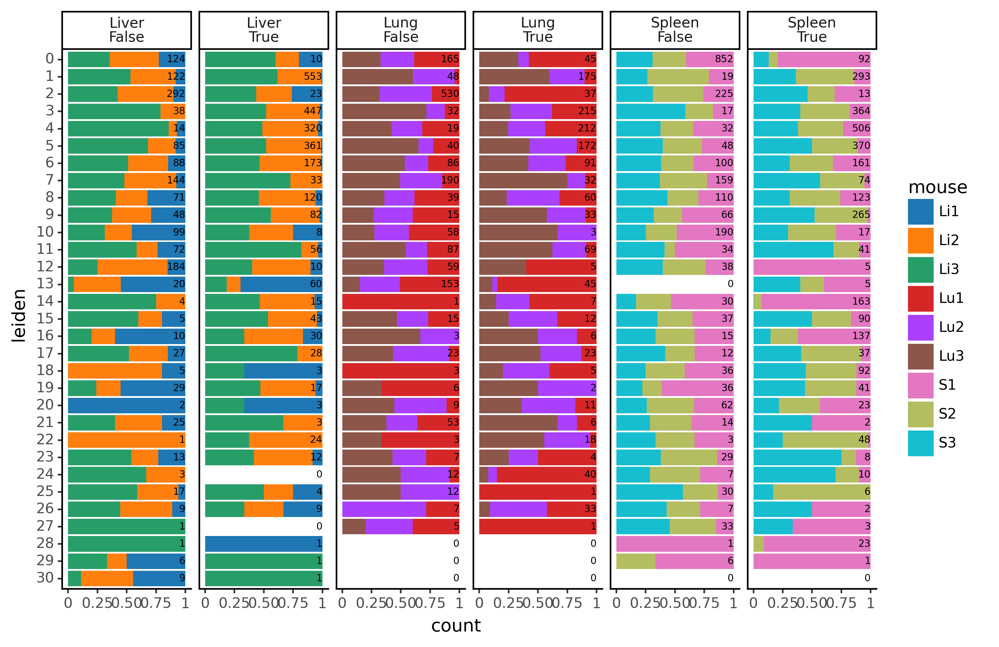

<ggplot: (8794542302660)>

In [30]:
sample_bar = ggplot(wt_tissue.obs, aes(x=" leiden ", fill = "mouse")) + geom_bar(position = "fill") + \
scale_fill_manual(wt_tissue.uns["mouse_colors"]) + theme_classic() + theme(dpi = 200, figure_size=(9, 6)) + \
coord_flip() +  geom_text(wt_tissue.obs.groupby([" leiden ", "tissue", "biotin_sample"]).count().reset_index(), aes(
    x = " leiden ", label = "total_counts"), y = 1, ha="right", color = "black", size = 6, inherit_aes = False)  + \
facet_wrap("~ tissue + biotin_sample", nrow=1)
ggsave(sample_bar, "tissue_sample_composition.pdf", dpi = 200)
sample_bar

## start annotating again, try using annotations from med LN

In [31]:
from scipy.cluster.hierarchy import dendrogram, linkage, set_link_color_palette

def make_cl_ln_dendrogram(fn, out_name = None, figsize = (30, 4)):
    ln =  pd.read_csv(fn, index_col=0)
    mean_tissue_leiden = wt_tissue[:, ln.columns]
    mean_tissue_leiden = pd.DataFrame(mean_tissue_leiden.layers[
        "theta_1"], columns = mean_tissue_leiden.var_names, index = mean_tissue_leiden.obs[
        "leiden"]).reset_index().groupby("leiden").mean()    
    dendrogram_input = pd.concat([mean_tissue_leiden, ln])
    print(dendrogram_input.shape)
    dist_matrix = linkage(dendrogram_input, metric='cosine', method = "average")
    print(dist_matrix.shape)
    plt.figure(figsize=figsize)
    plt.grid(False)
    set_link_color_palette(['black'])
    dendrogram(dist_matrix, above_threshold_color='black', leaf_font_size=16, show_contracted=True,
              labels = dendrogram_input.index)
    if out_name is not None:
        plt.savefig(out_name, bbox_inches='tight', dpi = 200)
    plt.show()
    

## <font color = "blue"> Extended Data Figure 15 Panel D

(42, 11558)
(41, 4)


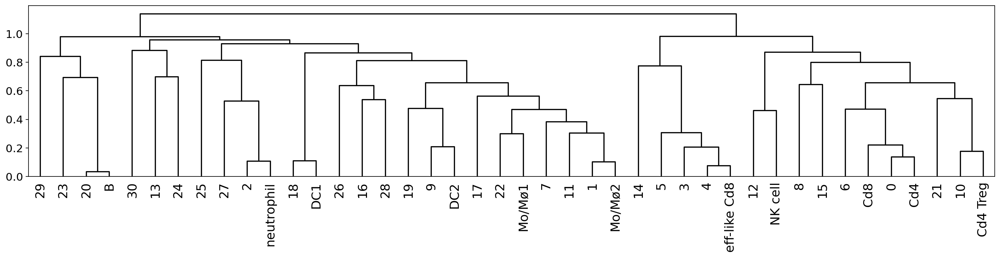

In [32]:
make_cl_ln_dendrogram("mean_ln_profiles.csv", "figures/tissue_dendrogram.pdf", figsize=(22,4))

## check these annotations make sense

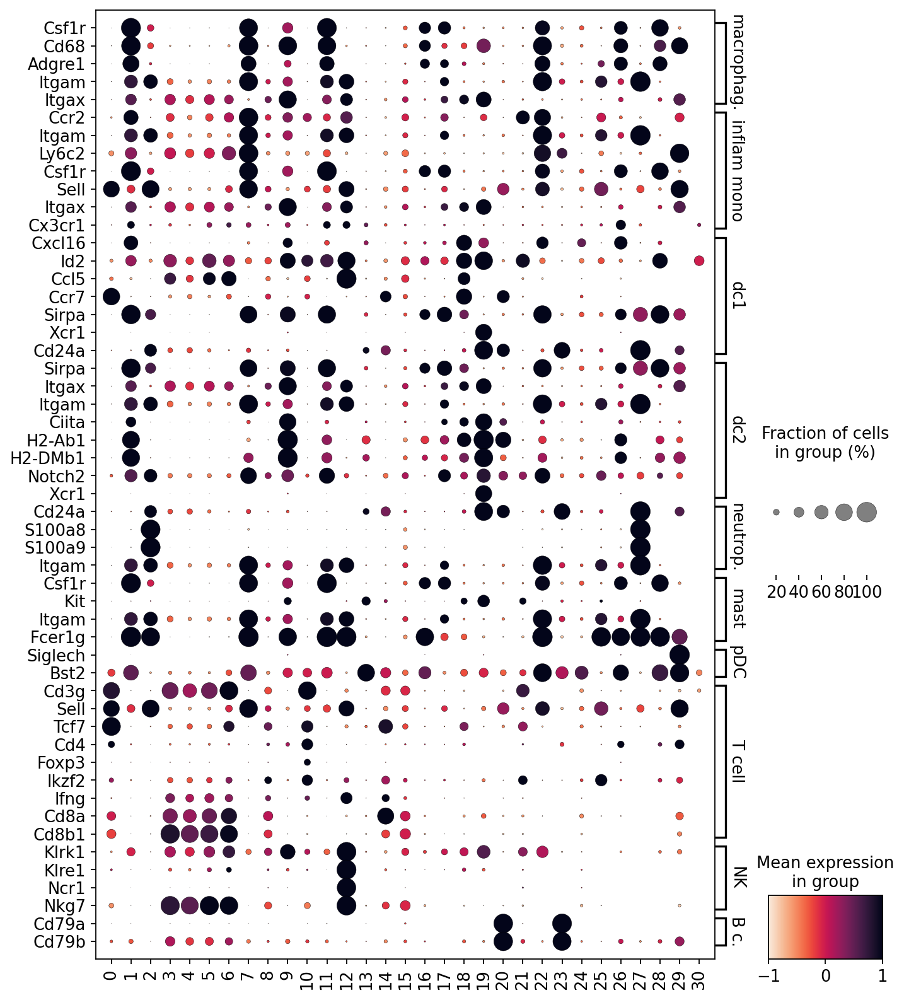

In [33]:
sc.pl.dotplot(wt_tissue, var_names = [
    "Csf1r", "Cd68", "Adgre1", "Itgam", "Itgax", # macrophage
    "Ccr2", "Itgam", "Ly6c2", "Csf1r", "Sell", "Itgax", "Cx3cr1",# inflam mono
    "Cxcl16", "Id2", "Ccl5", "Ccr7", "Sirpa", "Xcr1", "Cd24a",# dc1
    "Sirpa", "Itgax", "Itgam", "Ciita",  "H2-Ab1", "H2-DMb1", "Notch2", "Xcr1", "Cd24a", # dc2
    "S100a8", "S100a9", "Itgam", "Csf1r", # neutrophil
    "Kit", "Itgam", "Fcer1g", # mast?
    "Siglech", "Bst2", 
    "Cd3g", "Sell", "Tcf7", "Cd4",  "Foxp3", "Ikzf2",  "Ifng",   "Cd8a", "Cd8b1", ## some important T cell genes
    "Klrk1", "Klre1", "Ncr1", "Nkg7", # NK (also in Cd8 eff)
    "Cd79a", "Cd79b" # B cell
], groupby="leiden", norm = mpl.colors.Normalize(vmin=-1, vmax=1), swap_axes = True,  cmap="rocket_r",
              figsize=(10, 12), var_group_positions = [(0,4), (5,11), (12,18), (19, 26), (27, 30), (31,34), (
                  35, 36), (37, 45), (46,49), (50, 51)], var_group_labels=[
                  "macrophage", "inflam mono", "dc1", "dc2", "neutrophil", "mast", "pDC", "T cell", "NK", "B cell"], )

## what are the two distinct groups of leiden clusteres that are quite unlike lymph node cell types?

- 30, 13, 24, 25
- 26, 16, 28 

In [35]:
from helper_functions import * 

In [36]:
cl_lfcs = new_lfcs(wt_tissue, "raw_counts", "theta_1", cl_level = "leiden")

num genes with no counts in raw matrix: 0
(11558,)
0.05
(12324, 11558)
(1, 11558)
0.014118791557848454
0


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1448 genes; log2FC < -0.5: 1559 genes
1
  results: log2FC > 0.5: 1952 genes; log2FC < -0.5: 2118 genes
10


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1282 genes; log2FC < -0.5: 1076 genes
11


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1903 genes; log2FC < -0.5: 2133 genes
12


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1210 genes; log2FC < -0.5: 989 genes
13


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 2206 genes; log2FC < -0.5: 1929 genes
14
  results: log2FC > 0.5: 1960 genes; log2FC < -0.5: 2296 genes
15
  results: log2FC > 0.5: 1010 genes; log2FC < -0.5: 708 genes
16


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1854 genes; log2FC < -0.5: 2053 genes
17


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 2680 genes; log2FC < -0.5: 2120 genes
18


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1944 genes; log2FC < -0.5: 1039 genes
19


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1094 genes; log2FC < -0.5: 1907 genes
2


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 2673 genes; log2FC < -0.5: 2772 genes
20


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1241 genes; log2FC < -0.5: 786 genes
21


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1413 genes; log2FC < -0.5: 647 genes
22


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1525 genes; log2FC < -0.5: 2313 genes
23


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1559 genes; log2FC < -0.5: 2213 genes
24


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1788 genes; log2FC < -0.5: 613 genes
25


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1073 genes; log2FC < -0.5: 1021 genes
26


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1780 genes; log2FC < -0.5: 949 genes
27


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1020 genes; log2FC < -0.5: 2574 genes
28


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 2294 genes; log2FC < -0.5: 1085 genes
29


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide


  results: log2FC > 0.5: 357 genes; log2FC < -0.5: 101 genes
3


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 497 genes; log2FC < -0.5: 1447 genes
30


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 651 genes; log2FC < -0.5: 0 genes
4
  results: log2FC > 0.5: 1317 genes; log2FC < -0.5: 1794 genes
5
  results: log2FC > 0.5: 974 genes; log2FC < -0.5: 1464 genes
6


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 761 genes; log2FC < -0.5: 1480 genes
7


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1807 genes; log2FC < -0.5: 2093 genes
8


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 2409 genes; log2FC < -0.5: 2021 genes
9
  results: log2FC > 0.5: 1165 genes; log2FC < -0.5: 1623 genes


In [37]:
cl_lfcs.head()

,log2FC,cluster_means,noncluster_means,pval,padj,gene,cluster
3067,4.725248,1611.535278,60.911816,2.760023e-238,1.536988e-236,Tdrp,0
1446,4.474509,2340.103516,105.248993,2.745257e-235,1.505246e-233,Patj,0
1934,3.992362,1698.384521,106.699272,2.354208e-207,1.082632e-205,Gbp10,0
4252,3.974904,4824.956055,306.838104,0.000000e+00,0.000000e+00,Nsg2,0
4602,3.958353,6364.116699,409.393707,2.457225e-237,1.357760e-235,Igfbp4,0


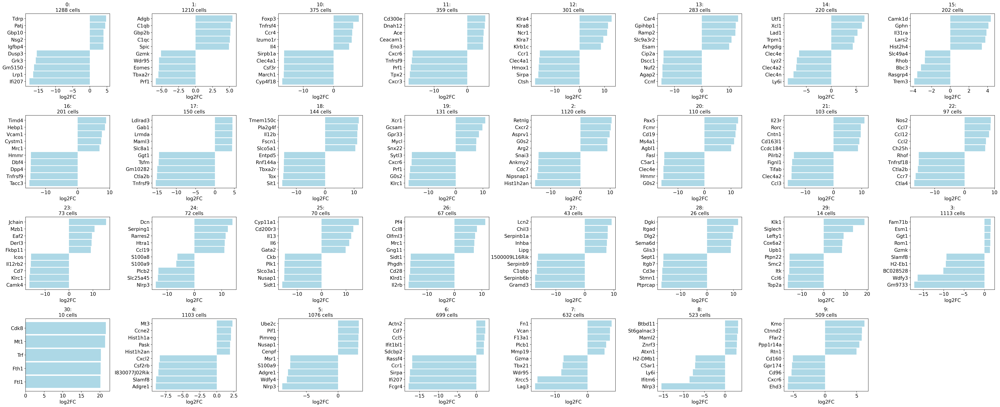

In [38]:
plot_diff_expr(cl_lfcs, adata=wt_tissue, nrows=4, hspace=0.4)

## first explore clusters 16, 26, and 28

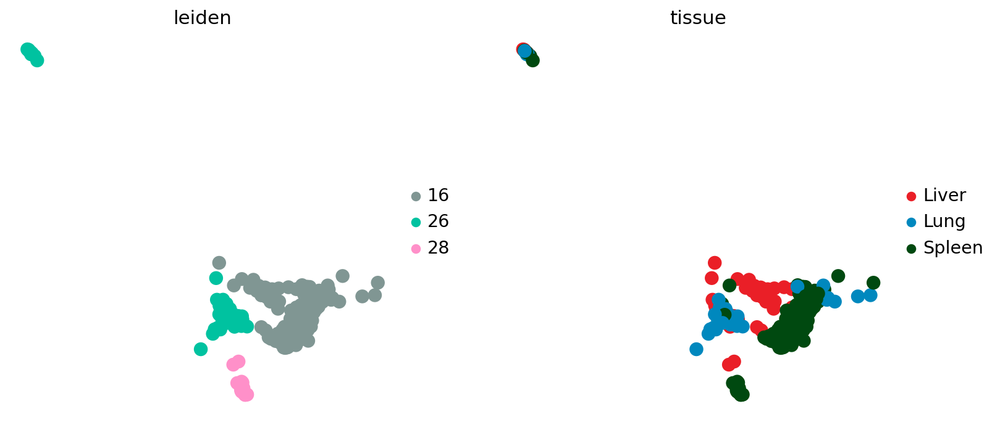

In [39]:
sc.pl.umap(wt_tissue[wt_tissue.obs.leiden.isin(["26", "16", "28"])], color = ['leiden', 'tissue'])

## use top 15 DEGs to determine top likely cell types with ImmGen [My Geneset](http://rstats.immgen.org/MyGeneSet_New/index.html)  tool

In [40]:
"\n".join(list(cl_lfcs[(cl_lfcs["cluster"] == "16") & (cl_lfcs["padj"] <= 0.05)].sort_values(
    "log2FC", ascending = False).head(n=15)["gene"]))

'Timd4\nHebp1\nVcam1\nCystm1\nMrc1\nSpic\nPtgs1\nTrf\nPrxl2b\nHmox1\nTmem141\nC1qa\nBlvrb\nApoe\nIl18bp'

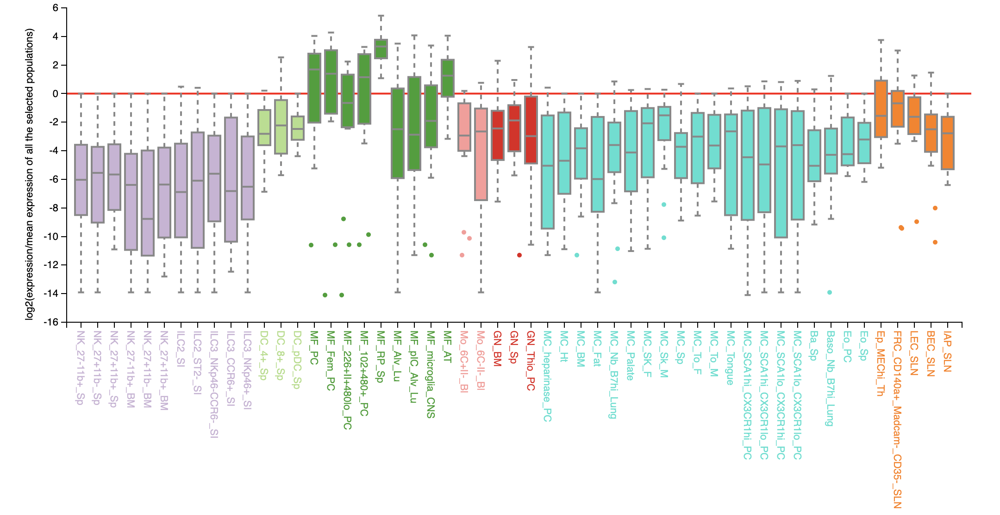

## These clusters might be Red pulp macrophages?
- high Adgre1 (F4/80)
- Cd80+, Cd86 +
- intermediate Itgam (Cd11c), 
- no Itgax (Cd11b), Cd4, Cd8


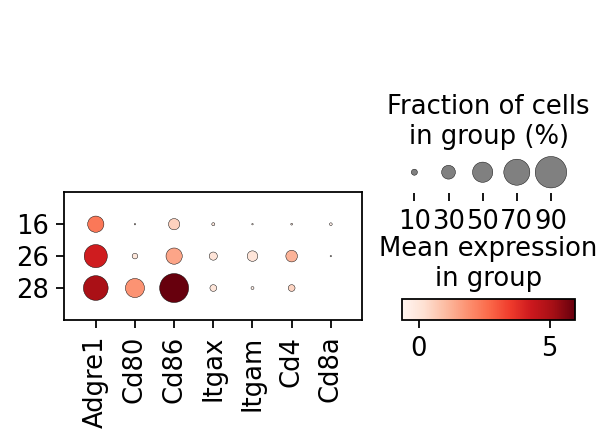

In [41]:
sc.pl.dotplot(wt_tissue[wt_tissue.obs.leiden.isin(["26", "16", "28"])], groupby = "leiden",
              var_names = ["Adgre1", "Cd80", "Cd86", "Itgax", "Itgam", "Cd4", "Cd8a"])

## now explore clusters 13, 24, 25, 30


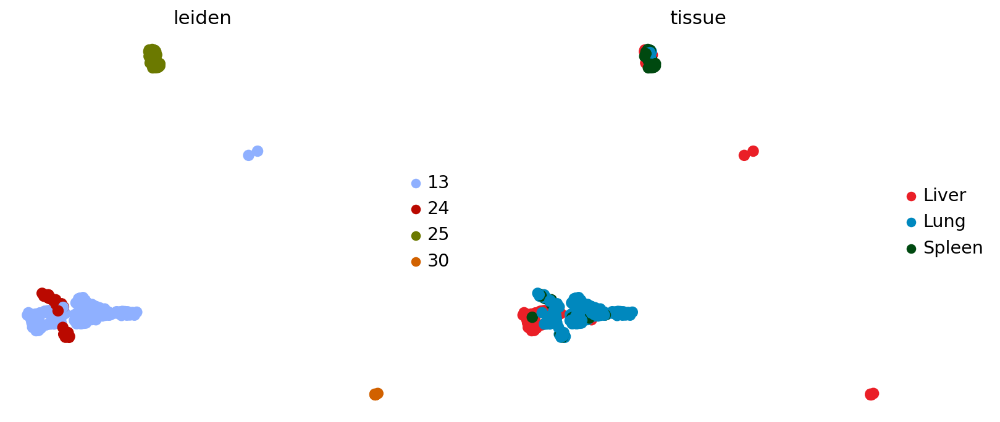

In [42]:
sc.pl.umap(wt_tissue[wt_tissue.obs.leiden.isin(["13", "24", "25", "30"])], color = ['leiden', 'tissue'])

## these clusters might be stromal cells

In [43]:
cl = "13"
n = 20
print("\n".join(cl_lfcs[cl_lfcs.cluster == cl].sort_values(["log2FC"], ascending = False).head(n= n)["gene"]))

Car4
Gpihbp1
Ramp2
Slc9a3r2
Esam
Clic5
Aqp1
Nes
Flt4
Efnb2
Npr1
Egfl7
Bcam
Efnb1
Cav2
Mapt
Sorbs3
Timp3
Rasgef1a
F8


looking at top 20 DEGs for cluster 13
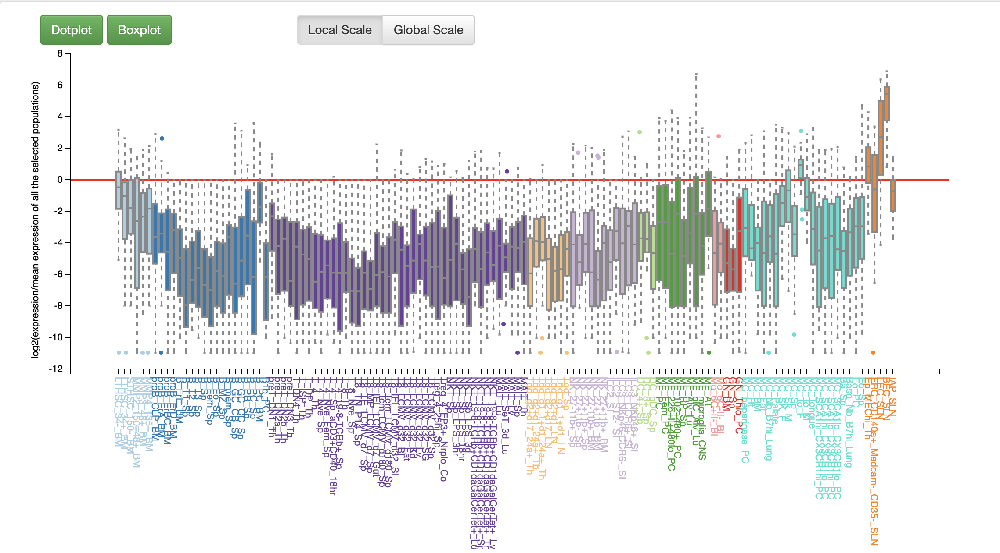

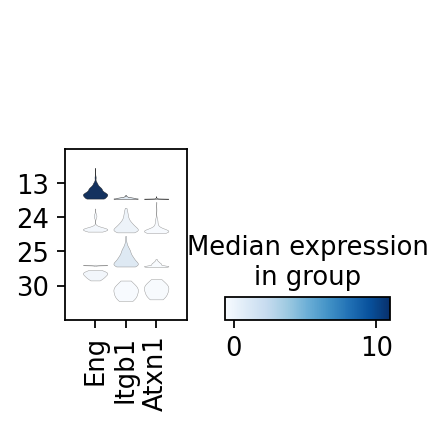

In [44]:
sc.pl.stacked_violin(wt_tissue[wt_tissue.obs.leiden.isin(["13", "24", "25", "30"])], groupby = "leiden",
              var_names = ["Eng", "Itgb1" , "Atxn1"])

In [45]:
def annot_by_medln(c):
    cl = int(c)
    if cl in [14, 5, 3, 4]:
        return "eff-like Cd8"
    elif cl == 12:
        return "NK cell"
    if cl in [8, 15, 6, 21]: # not Treg, just high Ikzf2
        return "Cd8"
    if cl == 0:
        return "Cd4"
    if cl == 10:
        return "Cd4 Treg"
    if cl in [29, 23, 20]:
        return "B cell"
    if cl in [25, 27 ,2]:
        return "neutrophil"
    if cl == 18:
        return "DC1"
    if cl in [19, 9]:
        return "DC2"
    if cl == 22:
        return "Mo/Mø1"
    if cl in [17, 7, 11, 1]:
        return "Mo/Mø2"
    if cl in [26, 16, 28]:
        return "red pulp macrophage"
    return "Other"

In [46]:
wt_tissue.obs["annot"] = [annot_by_medln(cl) for cl in wt_tissue.obs.leiden]

In [47]:
color_cats = {"B cell": "#666666", "Cd4": "#00b8ad", "Cd4 Treg": "#009964", "Cd8": "#0a67b2", 
              "eff-like Cd8": "#00c0e8", "NK cell": "#92278f", "DC1": "#ffcc05", "DC2": "#f47920", 
              "Mo/Mø1": "#ef4223", "Mo/Mø2": "#a82d25", "neutrophil": "#f8a084", "red pulp macrophage": "#E74359",
             "Other": "#bdac9a", }

In [48]:
wt_tissue.obs["annot"] = wt_tissue.obs["annot"].astype(pd.api.types.CategoricalDtype(list(
    color_cats.keys()), ordered = True))

In [49]:
wt_tissue.uns["annot_colors"] = list(color_cats.values())

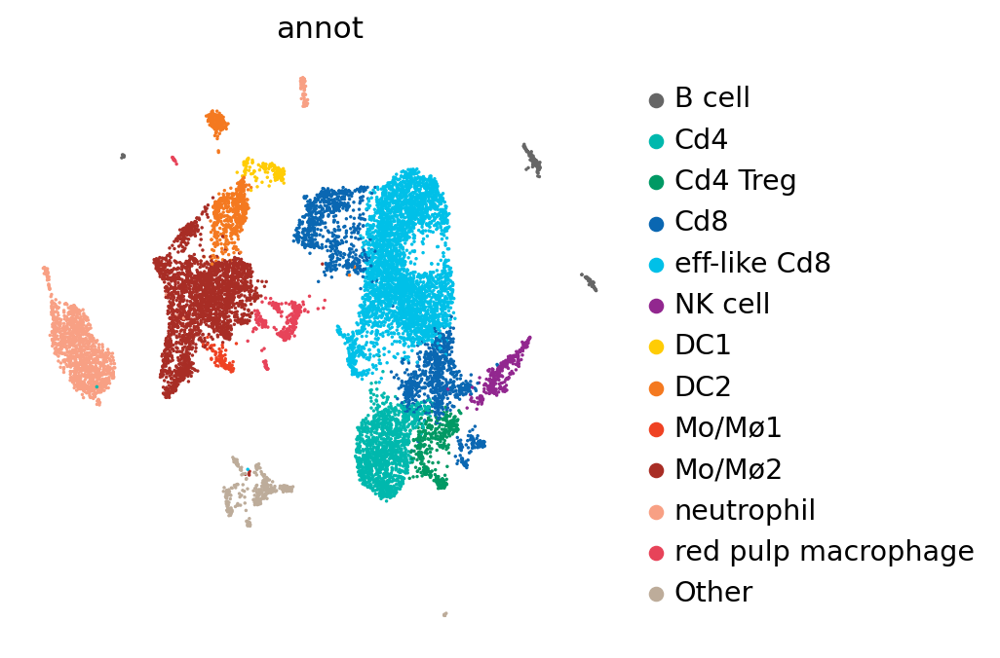

In [50]:
sc.pl.umap(wt_tissue, color = "annot")

## make better scale for biotin

In [51]:
fifth_pctile_biotin = np.quantile(wt_tissue.obs["cell_norm_biotin"], 0.05)
wt_tissue.obs["log normalized biotin"] = np.log10(wt_tissue.obs["cell_norm_biotin"] + fifth_pctile_biotin)

In [52]:
wt_tissue.obs["normalized biotin"] = wt_tissue.obs["log normalized biotin"] - np.min(
    wt_tissue.obs["log normalized biotin"])

/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/plotnine/layer.py:333: PlotnineWarning: stat_density : Removed 34 rows containing non-finite values.


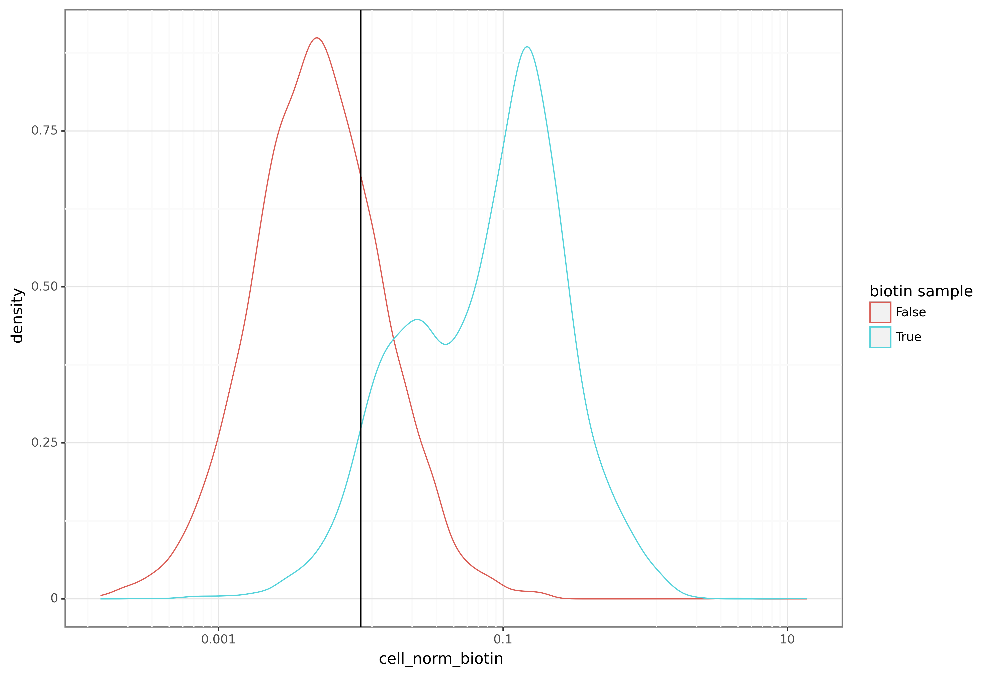

<ggplot: (8794541736180)>

In [53]:
ggplot(wt_tissue.obs, aes(x="cell_norm_biotin", color = "biotin sample")) + geom_density() + \
theme_bw() + theme(dpi = 200, figure_size=(10,8)) + geom_vline(xintercept = 1e-2) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/plotnine/layer.py:333: PlotnineWarning: stat_density : Removed 34 rows containing non-finite values.


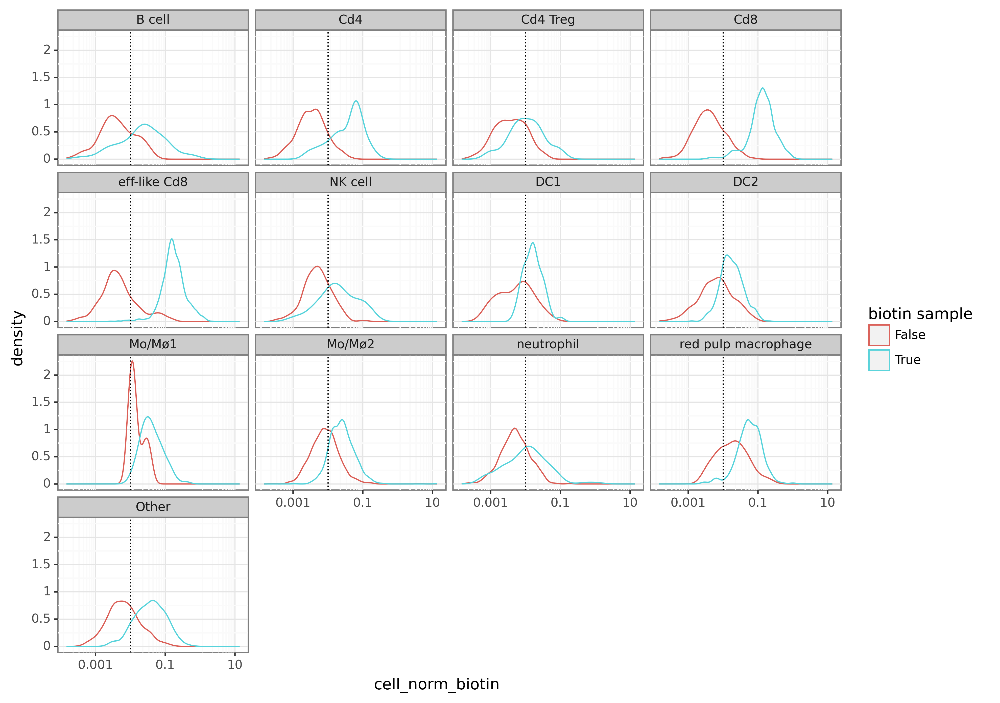

<ggplot: (8794541602130)>

In [54]:
ggplot(wt_tissue.obs, aes(x="cell_norm_biotin", color = "biotin sample")) + geom_density() + theme_bw() + theme(
    dpi = 200, figure_size = (10,8)) + geom_vline(xintercept = 1e-2, linetype = "dotted") + facet_wrap(
    "~ annot") + scale_x_log10()

In [55]:
norm_biotin_pos_threshold = np.log10(.01 + fifth_pctile_biotin) - np.min(wt_tissue.obs["log normalized biotin"])
norm_biotin_pos_threshold

0.9258842085980896

## base donor on Cd8 cells' donor levels

In [56]:
np.sum(wt_tissue.obs.annot.isna())

0

/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/plotnine/layer.py:333: PlotnineWarning: stat_density : Removed 19 rows containing non-finite values.


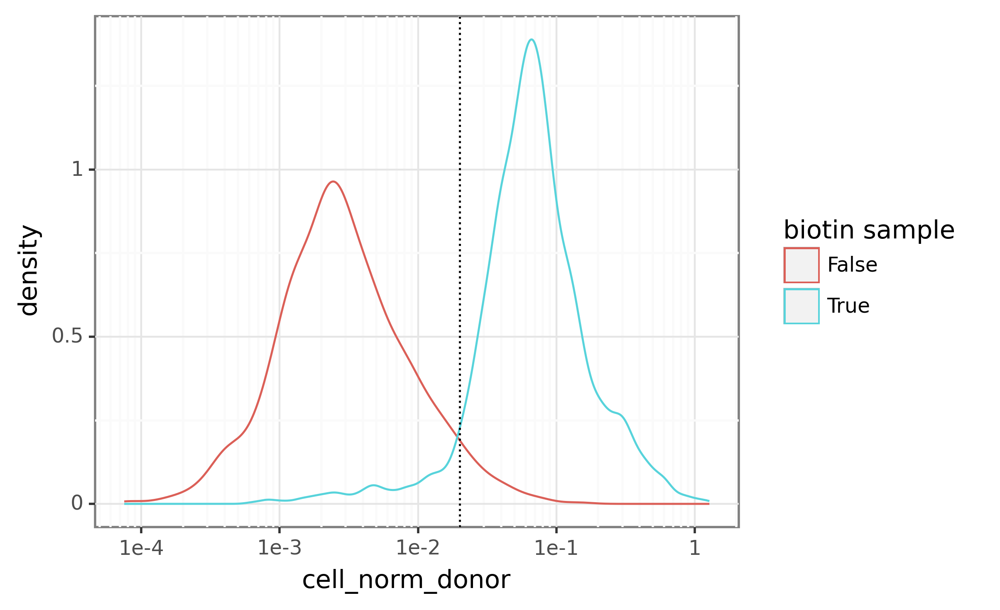

<ggplot: (8794543160667)>

In [57]:
ggplot(wt_tissue.obs[wt_tissue.obs.annot.str.contains("Cd8")], aes(x="cell_norm_donor", color = "biotin sample")) + \
geom_density() + scale_x_log10() + theme_bw() + theme(dpi = 200, figure_size=(5,4)) + geom_vline(
    xintercept = 0.02, linetype = "dotted") 

In [58]:
wt_tissue.obs["donor"] = (wt_tissue.obs["cell_norm_donor"] >= 0.02)

In [59]:
wt_tissue.obs[" donor "] = wt_tissue.obs["donor"].astype(str)

In [60]:
wt_tissue.obs["interactor"] = (~wt_tissue.obs["donor"]) & (
    wt_tissue.obs["normalized biotin"] >= norm_biotin_pos_threshold)

In [61]:
wt_tissue.obs[" interactor "] = wt_tissue.obs["interactor"].astype(str)

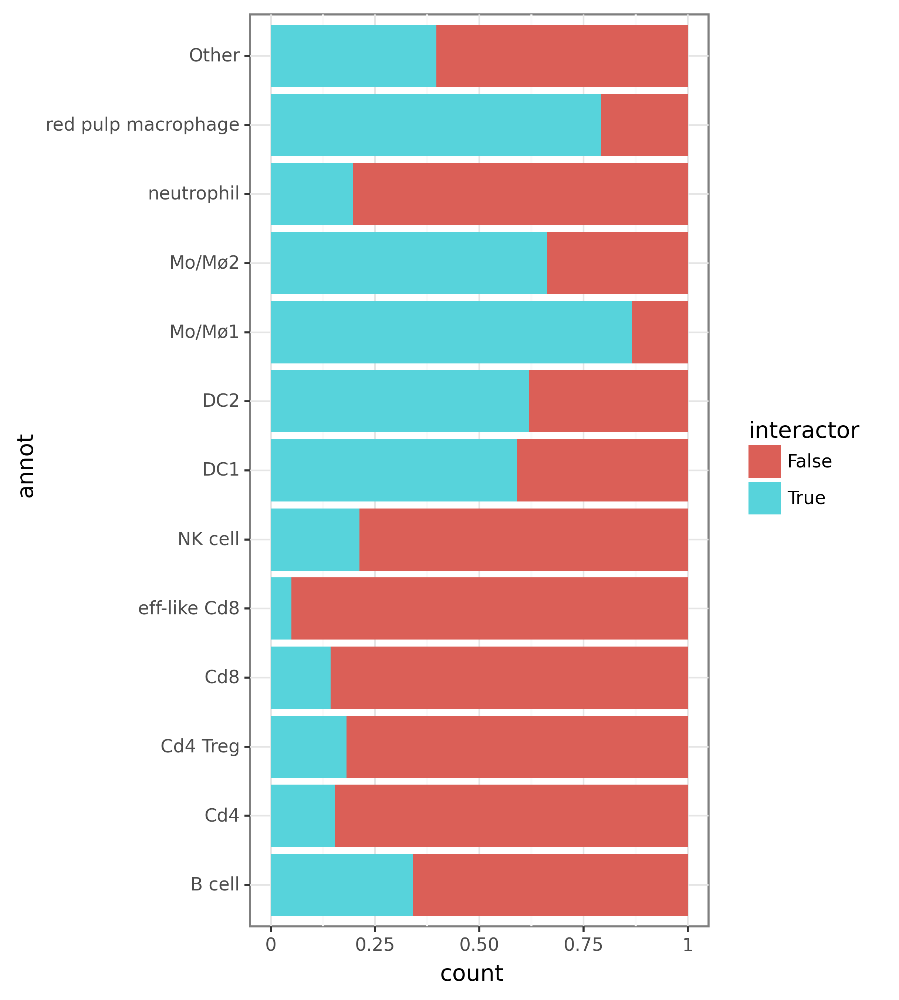

<ggplot: (8794542802402)>

In [68]:
ggplot(wt_tissue.obs, aes(x="annot", fill = "interactor")) + geom_bar(position = "fill") + theme_bw() + \
theme(dpi = 200, figure_size=(4,8)) + coord_flip()

## <font color = "magenta"> Figure 5 Panel I, left

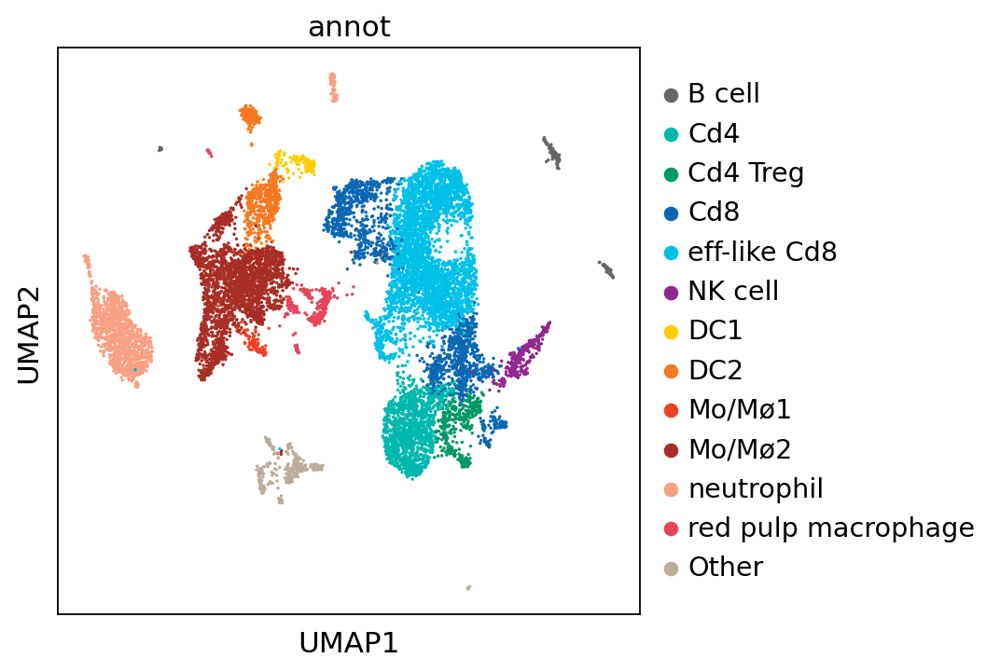

In [69]:
sc.pl.umap(wt_tissue, color = "annot", vmin = "p2", vmax = "p98", save=".panel_j2_all_cells.pdf")

In [70]:
wt_tissue.obs[" normalized biotin "] = wt_tissue.obs["normalized biotin"].copy()
wt_tissue.obs.loc[wt_tissue.obs["donor"], " normalized biotin "] = np.nan

In [71]:
sc.set_figure_params(dpi_save=200, vector_friendly=False)

In [72]:
np.sum(wt_tissue.obs[" normalized biotin "].isna())

4249

## <font color = "magenta"> Figure 5 Panel I, right

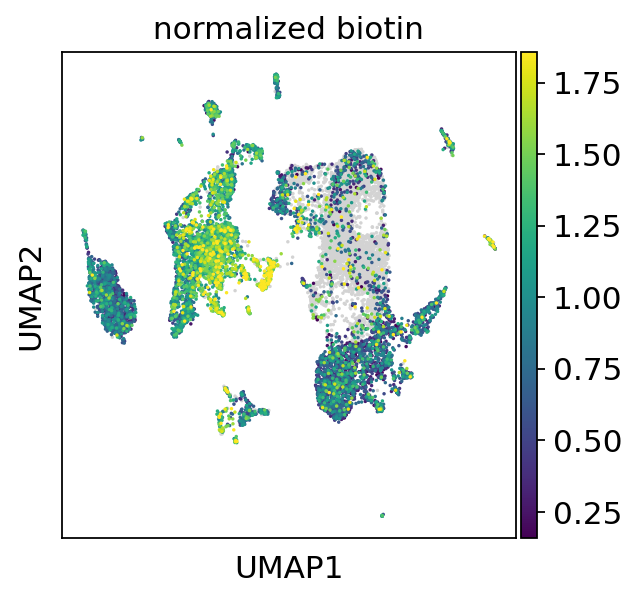

In [73]:
sc.pl.umap(wt_tissue, color = [" normalized biotin "], vmin = "p2", vmax = "p98",
           save=".panel_j3_all_cells.pdf" )

In [74]:
wt_tissue.obs["background"] = ["background" if not bs else "biotin + samp" for bs in wt_tissue.obs["biotin sample"]]

In [75]:
wt_tissue.obs[" interactor "] = ["interactor" if i else "not interacting" for i in wt_tissue.obs["interactor"]]

In [76]:
wt_tissue.obs[" annot "] = wt_tissue.obs["annot"].str.replace(" ",  "\n").astype(pd.api.types.CategoricalDtype(
    pd.Series(color_cats.keys()).str.replace(" ", "\n"), ordered = True))


## <font color = "magenta"> Figure 5 Panel J

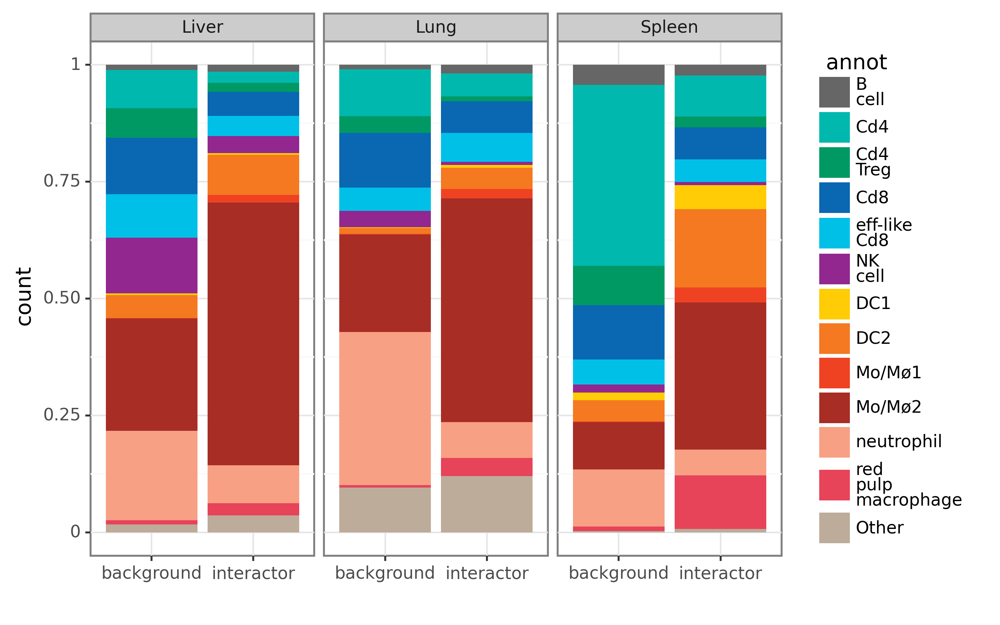

/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 6.4 x 4.8 in image.
/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: figures/barplot.panel_k.pdf


In [77]:
p = ggplot(wt_tissue[(~wt_tissue.obs["donor"]) & (~wt_tissue.obs["biotin sample"])].obs, aes(
    x="background", fill = " annot ")) + geom_bar(position = "fill") + geom_bar(wt_tissue[(
    ~wt_tissue.obs["donor"]) & (wt_tissue.obs["interactor"])].obs, aes(x = " interactor "), position = "fill") + \
theme_bw() + theme(dpi = 200) + scale_fill_manual(list(color_cats.values())) + facet_wrap("~ tissue") + \
labs(x=" ")
print(p)
ggsave(p, "figures/barplot.panel_k.pdf", dpi = 200)

In [78]:
annot_lfcs = new_lfcs(wt_tissue, "raw_counts", "theta_1", cl_level = "annot")

num genes with no counts in raw matrix: 0
(11558,)
0.05
(12324, 11558)
(1, 11558)
0.014118791557848454
B cell
  results: log2FC > 0.5: 610 genes; log2FC < -0.5: 1656 genes
Cd4


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1448 genes; log2FC < -0.5: 1559 genes
Cd4 Treg


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1282 genes; log2FC < -0.5: 1076 genes
Cd8
  results: log2FC > 0.5: 1225 genes; log2FC < -0.5: 922 genes
DC1


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1944 genes; log2FC < -0.5: 1039 genes
DC2
  results: log2FC > 0.5: 1199 genes; log2FC < -0.5: 1587 genes
Mo/Mø1


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1525 genes; log2FC < -0.5: 2313 genes
Mo/Mø2
  results: log2FC > 0.5: 2140 genes; log2FC < -0.5: 2202 genes
NK cell


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1210 genes; log2FC < -0.5: 989 genes
Other
  results: log2FC > 0.5: 1982 genes; log2FC < -0.5: 1629 genes
eff-like Cd8
  results: log2FC > 0.5: 2114 genes; log2FC < -0.5: 2332 genes
neutrophil
  results: log2FC > 0.5: 2573 genes; log2FC < -0.5: 2630 genes
red pulp macrophage


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1745 genes; log2FC < -0.5: 1642 genes


In [79]:
annot_lfcs.head()

,log2FC,cluster_means,noncluster_means,pval,padj,gene,cluster
1904,14.372308,545459.750000,25.705652,2.154368e-40,1.913398e-38,Jchain,B cell
6566,14.189994,46999.640625,2.500550,5.376396e-107,1.933890e-103,Mzb1,B cell
5958,12.868307,29273.548828,3.900858,4.144704e-95,5.963399e-92,Iglc2,B cell
222,12.691639,6048.666992,0.900198,2.802264e-18,3.952841e-17,Fcmr,B cell
2618,12.576227,34292.441406,5.601232,9.717682e-110,6.990900e-106,Cd79a,B cell


## <font color = "blue"> Extended Data Figure 15 Panel E

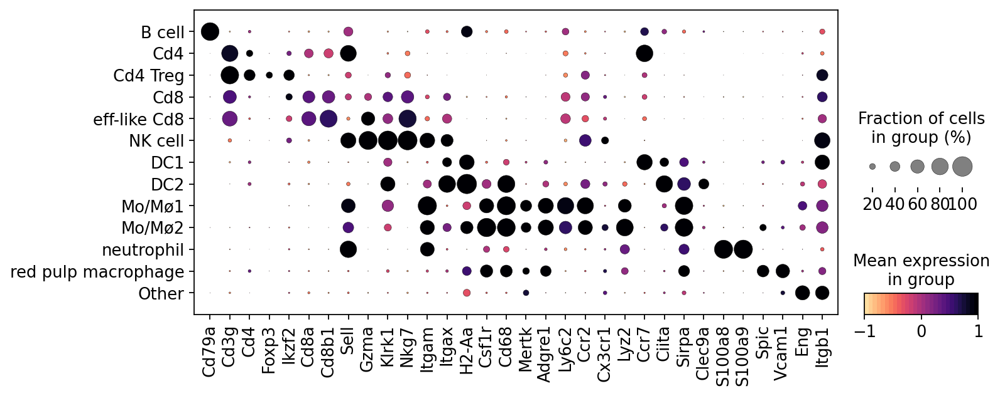

In [81]:
sc.pl.dotplot(wt_tissue, var_names = ["Cd79a", "Cd3g", "Cd4", "Foxp3", "Ikzf2", "Cd8a", "Cd8b1", "Sell", "Gzma",
                                      "Klrk1", "Nkg7", "Itgam", "Itgax",  "H2-Aa", "Csf1r", "Cd68", "Mertk", "Adgre1",
                                      "Ly6c2", "Ccr2", "Cx3cr1", "Lyz2","Ccr7", "Ciita", "Sirpa", "Clec9a", "S100a8",
                                      "S100a9", "Spic", "Vcam1", "Eng", "Itgb1"], groupby = "annot", layer="theta_1", 
              cmap = magma_cmap, figsize=(10, 4), norm = mpl.colors.Normalize(vmin=-1, vmax=1),
              save = "tissue_annot_more_genes.pdf")

In [82]:
cmap = mpl.cm.get_cmap("magma_r")(np.linspace(0,1,30))
magma_cmap = mpl.colors.ListedColormap(cmap[2:,:-1])

## <font color = "blue"> Extended Data Figure 15 Panel F

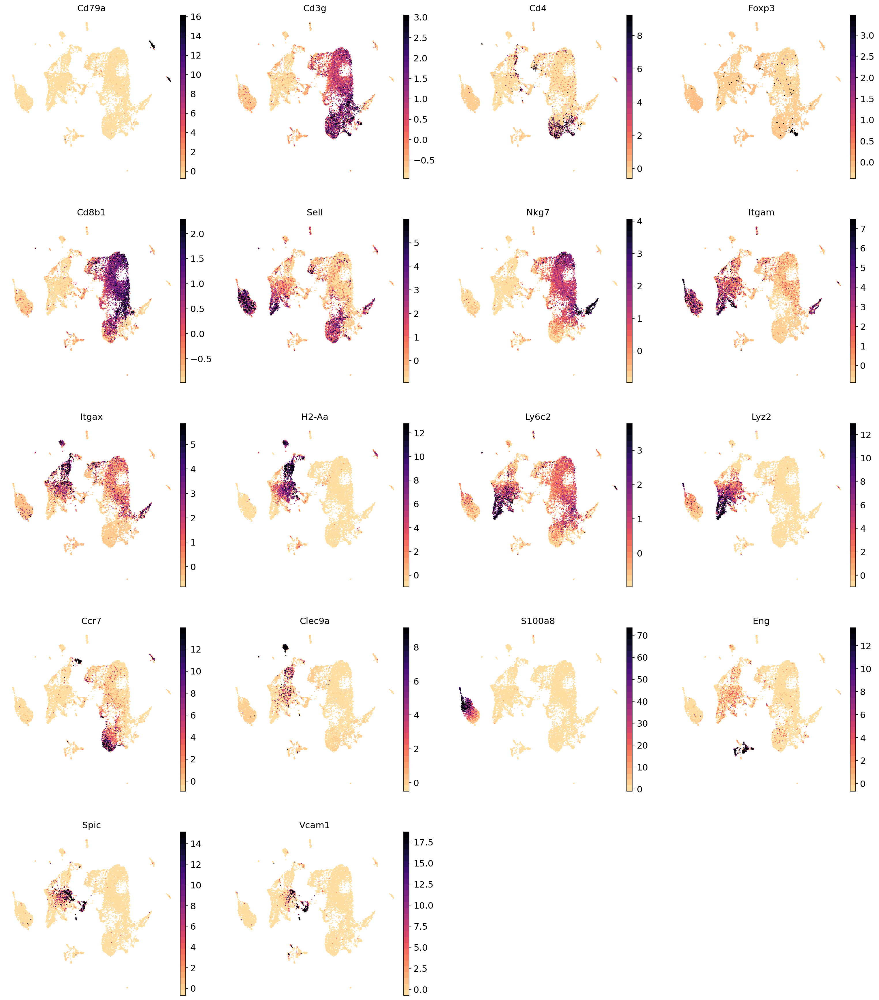

In [83]:
sc.set_figure_params(dpi_save=200, vector_friendly=False, figsize=(5,5), frameon=False)
sc.pl.umap(wt_tissue, color = ["Cd79a", "Cd3g", "Cd4", "Foxp3", "Cd8b1", "Sell", "Nkg7", "Itgam", "Itgax",  "H2-Aa", 
                               "Ly6c2", "Lyz2","Ccr7",  "Clec9a", "S100a8", "Eng", "Spic", "Vcam1"], layer="theta_1", 
           cmap = magma_cmap, vmin = "p1", vmax = "p99", save = ".tissue_genes.pdf")

## <font color = "blue"> Extended Data Figure 15 Panel G

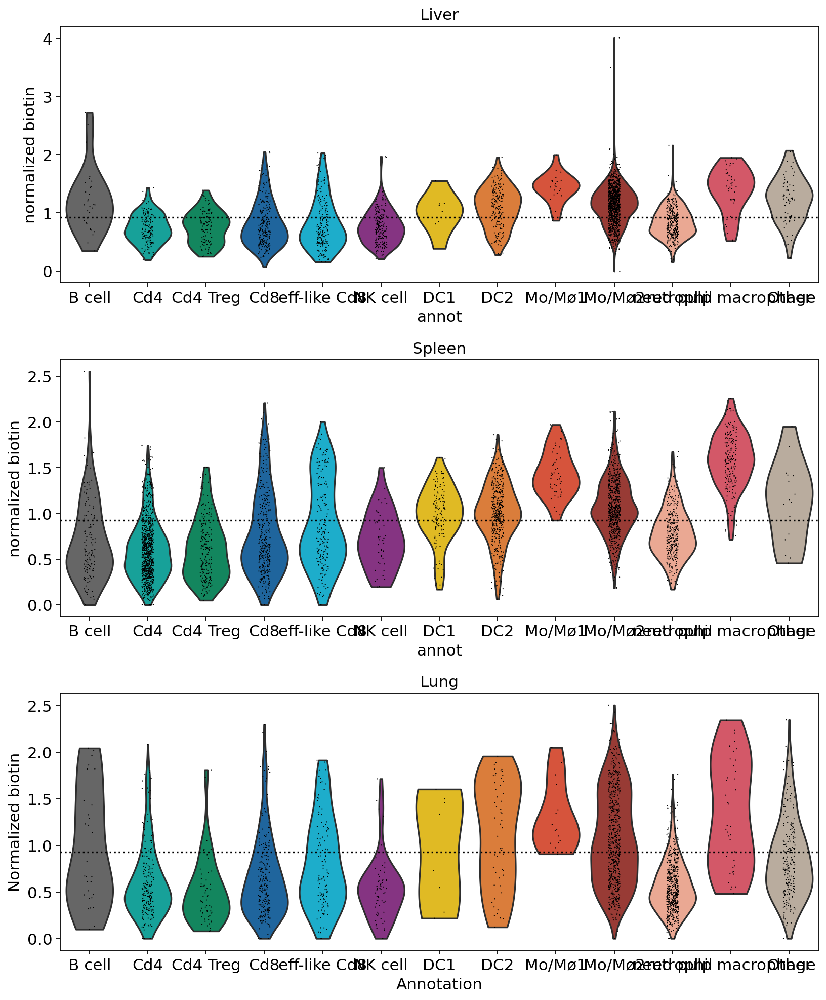

In [84]:
fig, axes = plt.subplots(3, 1, figsize=(12, 15), gridspec_kw={"hspace": 0.3})
for i, t in enumerate(wt_tissue.obs.tissue.unique()):
    sc.pl.violin(wt_tissue[(wt_tissue.obs.tissue == t) & (~wt_tissue.obs.donor)], keys = "normalized biotin", 
                 groupby="annot", ax = axes[i], show = False, title = t)
    axes[i].grid(False)
    axes[i].title.set_text(t)
    axes[i].axhline(norm_biotin_pos_threshold, color = "black", linestyle="dotted")

plt.xlabel("Annotation")
plt.ylabel("Normalized biotin")
fig.savefig("tissue_violin_biotin.pdf",  bbox_inches='tight')
sc.set_figure_params(figsize=(5,5))

In [85]:
annot_lfcs = new_lfcs(wt_tissue, "raw_counts", "theta_1", cl_level = "annot")

num genes with no counts in raw matrix: 0
(11558,)
0.05
(12324, 11558)
(1, 11558)
0.014118791557848454
B cell
  results: log2FC > 0.5: 610 genes; log2FC < -0.5: 1656 genes
Cd4


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1448 genes; log2FC < -0.5: 1559 genes
Cd4 Treg


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1282 genes; log2FC < -0.5: 1076 genes
Cd8
  results: log2FC > 0.5: 1225 genes; log2FC < -0.5: 922 genes
DC1


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1944 genes; log2FC < -0.5: 1039 genes
DC2
  results: log2FC > 0.5: 1199 genes; log2FC < -0.5: 1587 genes
Mo/Mø1


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1525 genes; log2FC < -0.5: 2313 genes
Mo/Mø2
  results: log2FC > 0.5: 2140 genes; log2FC < -0.5: 2202 genes
NK cell


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1210 genes; log2FC < -0.5: 989 genes
Other
  results: log2FC > 0.5: 1982 genes; log2FC < -0.5: 1629 genes
eff-like Cd8
  results: log2FC > 0.5: 2114 genes; log2FC < -0.5: 2332 genes
neutrophil
  results: log2FC > 0.5: 2573 genes; log2FC < -0.5: 2630 genes
red pulp macrophage


/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/scipy/stats/_stats_py.py:279: RuntimeWarning: divide by zero encountered in log
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:29: RuntimeWarning: divide by zero encountered in true_divide


  results: log2FC > 0.5: 1745 genes; log2FC < -0.5: 1642 genes


In [86]:
annot_lfcs.head()

,log2FC,cluster_means,noncluster_means,pval,padj,gene,cluster
1904,14.372308,545459.750000,25.705652,2.154368e-40,1.913398e-38,Jchain,B cell
6566,14.189994,46999.640625,2.500550,5.376396e-107,1.933890e-103,Mzb1,B cell
5958,12.868307,29273.548828,3.900858,4.144704e-95,5.963399e-92,Iglc2,B cell
222,12.691639,6048.666992,0.900198,2.802264e-18,3.952841e-17,Fcmr,B cell
2618,12.576227,34292.441406,5.601232,9.717682e-110,6.990900e-106,Cd79a,B cell


In [87]:
write_lfc_spreadsheet(annot_lfcs, out_name = "tissue_degs.by_annot.xls", sort_column = "log2FC",
                        sheet_name_col="cluster")

/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:103: FutureWarning: As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead. You can set the option io.excel.xls.writer to 'xlwt' to silence this warning. While this option is deprecated and will also raise a warning, it can be globally set and the warning suppressed.


In [88]:
!(python --version)

Python 3.9.11


In [89]:
wt_tissue.write_h5ad("lcmv.final_wt_tissue.h5ad")